In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import os
import glob
import cv2
import numpy as np
import imutils
import tensorflow as tf
from sklearn.model_selection import train_test_split
import random
from skimage import io
import datetime

In [ ]:
!pip install -U -q PyDrive
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials

In [ ]:
auth.authenticate_user()
gauth=GoogleAuth()
gauth.credentials=GoogleCredentials.get_application_default()
drive=GoogleDrive(gauth)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install kaggle
from google.colab import files
from datetime import datetime
api_token = files.upload()

Saving kaggle.json to kaggle.json


In [ ]:
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json

In [ ]:
!kaggle datasets download mateuszbuda/lgg-mri-segmentation 

100% 713M/714M [00:22<00:00, 37.3MB/s]
100% 714M/714M [00:22<00:00, 33.0MB/s]


In [ ]:
!unzip /content/lgg-mri-segmentation.zip

In [ ]:
df = pd.read_csv("/content/lgg-mri-segmentation/kaggle_3m/data.csv")
df.head()

,Patient,RNASeqCluster,MethylationCluster,miRNACluster,CNCluster,RPPACluster,OncosignCluster,COCCluster,histological_type,neoplasm_histologic_grade,tumor_tissue_site,laterality,tumor_location,gender,age_at_initial_pathologic,race,ethnicity,death01
0,TCGA_CS_4941,2.0,4.0,2,2.0,NaN,3.0,2,1.0,2.0,1.0,3.0,2.0,2.0,67.0,3.0,2.0,1.0
1,TCGA_CS_4942,1.0,5.0,2,1.0,1.0,2.0,1,1.0,2.0,1.0,3.0,2.0,1.0,44.0,2.0,NaN,1.0
2,TCGA_CS_4943,1.0,5.0,2,1.0,2.0,2.0,1,1.0,2.0,1.0,1.0,2.0,2.0,37.0,3.0,NaN,0.0
3,TCGA_CS_4944,NaN,5.0,2,1.0,2.0,1.0,1,1.0,1.0,1.0,3.0,6.0,2.0,50.0,3.0,NaN,0.0
4,TCGA_CS_5393,4.0,5.0,2,1.0,2.0,3.0,1,1.0,2.0,1.0,1.0,6.0,2.0,39.0,3.0,NaN,0.0


In [ ]:
PATH = "/content/lgg-mri-segmentation/kaggle_3m"
list_dir = []
for dir in os.listdir(PATH):
    dir = PATH + '/' + dir
    if os.path.isdir(dir):
        list_dir.append(dir)

In [ ]:
MRI_image = []
MRI_mask = []
for i in range(len(list_dir)):
    directory_path = list_dir[i]
    for mask in os.listdir(directory_path):
        if '_mask' in mask:
            MRI_mask.append(directory_path + '/' + mask)
            mask = mask.replace('_mask','')
            MRI_image.append(directory_path + '/' + mask)

In [ ]:
images_df = pd.DataFrame(data = zip(MRI_image,MRI_mask),columns= ['MRI_image', 'MRI_mask'])
images_df.head()

,MRI_image,MRI_mask
0,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...
1,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...
2,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...
3,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...
4,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...


In [ ]:
def plot_pair(image,mask):
    """
    Inputs: image and mask 
    Outputs: plot both image and plot side by side
    """
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(7, 5))
    axes[0].imshow(image)
    axes[0].get_xaxis().set_visible(False)
    axes[0].get_yaxis().set_visible(False)
    axes[1].imshow(mask)
    axes[1].get_xaxis().set_visible(False)
    axes[1].get_yaxis().set_visible(False)
    fig.tight_layout()

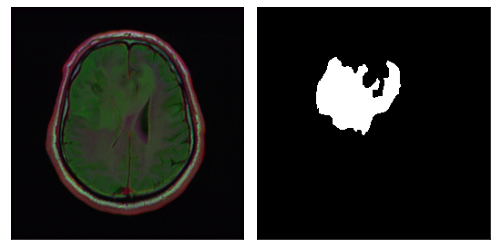

In [ ]:
import cv2
image = cv2.imread(images_df['MRI_image'][4])
mask = cv2.imread(images_df['MRI_mask'][4])

plot_pair(image,mask)

In [ ]:
def istumor(mask_img):
    """
    Finding wheather the mask has tumor or not
    """
    mask_img = cv2.imread(mask_img)
    k = np.max(mask_img)
    return 1 if k>0 else 0

In [ ]:
images_df["is_tumor"] = images_df['MRI_mask'].apply(istumor)

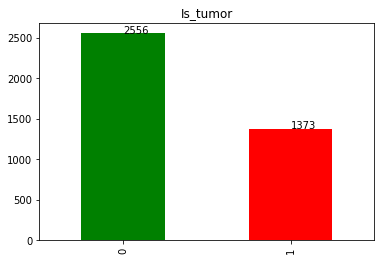

In [ ]:
ax = images_df["is_tumor"].value_counts().plot(kind = "bar",title = "Is_tumor",color=['g','r'] )
for patch in ax.patches:
    #print(patch)
    ax.annotate(xy = (patch.get_x() + 0.25 ,patch.get_height()+0.5 ),s = str(patch.get_height()) )

In [ ]:
tumor_data  = images_df[images_df["is_tumor"] == 1]

In [ ]:
X_train,X_val = train_test_split(tumor_data, test_size=0.2)
X_test,X_val = train_test_split(X_val, test_size=0.5)

print("Train data shape", X_train.shape)
print("Test data shape", X_test.shape)
print("Validation data shape", X_val.shape)

Train data shape (1098, 3)
Test data shape (137, 3)
Validation data shape (138, 3)


In [ ]:
class Datagenerator(tf.keras.utils.Sequence):
    def __init__(self,df, X_col,Y_col ,img_h , img_w ,batch_size = 16, shuffle = True):
        self.batch_size = batch_size
        self.df = df
        self.n = len(self.df)

        self.X_col = X_col
        self.Y_col = Y_col
        self.img_h = img_h
        self.img_w = img_w
        self.shuffle = shuffle
        self.on_epoch_end()


    def __len__(self):
        """
        It is returns the number of batches .
        Complusory method
        """
        return int( self.n/self.batch_size)

    
    def __getitem__(self, index):
        """
        Returns a batch of input image and its respective mask.
        """
        # Getting indices of length batcg size
        indices = self.indices[ index * self.batch_size : (index +1) * self.batch_size]

        X,Y = self.__data_generation(indices)

        return X,Y


    def on_epoch_end(self):
        """
        Shuffling indices after each epoch
        """
        self.indices = np.array(self.df.index) #np.arange(self.n)

        if self.shuffle:
            #self.indices = np.random.permutation( self.indices )
            np.random.shuffle(self.indices)

    def __data_generation(self,indices):
        """
        Return a single batch of (X,Y) of images and there segmentation mask
        with preprocessing applied.

        """
        X = np.empty((self.batch_size,self.img_h,self.img_w, 3 )) # input is 3 channel
        Y = np.empty((self.batch_size,self.img_h,self.img_w, 1 )) # mask is 1 channel

        for i in range(self.batch_size):
            idx = indices[i]
            img_path = str(self.df.loc[idx]['MRI_image'])

            mask_path = str(self.df.loc[idx]['MRI_mask'])

            img = cv2.imread(img_path,cv2.IMREAD_UNCHANGED)
            mask = cv2.imread(mask_path,cv2.IMREAD_UNCHANGED)

            # resize img and convert to array
            img = cv2.resize(img,(self.img_h, self.img_w))
            img = np.array(img, dtype = np.float64)

            # resize mask and convert to array
            mask = cv2.resize(mask,(self.img_h, self.img_w))
            mask = np.array(mask, dtype = np.float64)

            #standardising , This has improved the performance of model and images are better visible
            #img/=255.0
            #mask/=255.0
            img -= img.mean()
            img /= img.std()

            mask -= mask.mean()
            mask /= mask.std()


            #print(i)
            #print(img.shape,mask.shape) -> (256, 256, 3) (256, 256)

            X[i,] = img

            Y[i,] = np.expand_dims(mask,axis = 2)
            #Y[i,] = mask
            #Y[Y>0] = 255
            #Y = (Y > 0).astype(int)
        #Y = (Y > 0).astype(int)
        Y = (Y > 0).astype(np.float64)

        #print(X.shape,Y.shape)
        #Y = (Y > 0).astype(int)

        
        return X,Y

In [ ]:
#https://towardsdatascience.com/dealing-with-class-imbalanced-image-datasets-1cbd17de76b5
from keras.losses import binary_crossentropy
import keras.backend as K
import tensorflow as tf

smooth=1e-6

def tversky(y_true, y_pred):
    y_true_pos = K.flatten(y_true)
    y_pred_pos = K.flatten(y_pred)
    true_pos = K.sum(y_true_pos * y_pred_pos)
    false_neg = K.sum(y_true_pos * (1-y_pred_pos))
    false_pos = K.sum((1-y_true_pos)*y_pred_pos)
    alpha = 0.7
    return (true_pos + smooth)/(true_pos + alpha*false_neg + (1-alpha)*false_pos + smooth)

def tversky_loss(y_true, y_pred):
    return 1 - tversky(y_true,y_pred)

def focal_tversky(y_true,y_pred):
    y_true = tf.cast(y_true,tf.float32)
    y_pred = tf.cast(y_pred,tf.float32)
    #pt_1 = tversky(y_true, y_pred)
    #print(pt_1)
    gamma = 0.75
    return K.pow((1-tversky(y_true, y_pred)), gamma)

In [ ]:
def predict_mask(image_path,model):
  img = cv2.imread(image_path)
  # resize img and convert to array
  img = cv2.resize(img,(256, 256))
  img = np.array(img, dtype = np.float64)
  #normalizing image
  #img/=255.0
  img -= img.mean()
  img /= img.std()
  #ValueError: Input 0 of layer "model" is incompatible with the layer: expected shape=(None, 256, 256, 3), found shape=(32, 256, 3)
  X = np.empty((1,256,256,3))
  X[0,] = img
  prediction = model.predict(X)
  #print("prediction:",prediction.shape)  ->prediction: (1, 256, 256, 1)
  #TypeError: Invalid shape (1, 256, 256, 1) for image data  -> reshape the predicted image
  return prediction.reshape(256,256)

In [ ]:
tf.keras.backend.clear_session()
!rm -rf ./logs/

In [ ]:
!pip install -U segmentation-models

Custom model for UNET with RESNET34:

=================================================================================================================
UNET useful to detect tumor on MRI scan as well as to localise the area of abnormality.

it has a “U” shape. The architecture is symmetric and consists of two major parts.

the left part is called contracting path, which is constituted by the general convolutional process;

the right part is expansive path, which is constituted by transposed 2d convolutional layers(you can think it as an upsampling technic for now).

=================================================================================================================



=================================================================================================================
UNET WITH RESIDUAL BLOCK:

https://towardsdatascience.com/only-numpy-implementing-simple-resnet-for-mnist-classification-with-interactive-code-d58c77064304  - useful to write code for resblock

https://machinelearningmastery.com/how-to-implement-major-architecture-innovations-for-convolutional-neural-networks/

https://towardsdatascience.com/u-nets-with-resnet-encoders-and-cross-connections-d8ba94125a2c

=================================================================================================================

=================================================================================================================

A key innovation in the ResNet was the residual module. 

The residual module, specifically the identity residual model, is a block of two convolutional layers with the same number of filters and a small filter size where the output of the second layer is added with the input to the first convolutional layer. 

Drawn as a graph, the input to the module is added to the output of the module and is called a shortcut connection.

LIMITATION ON RESIDUAL BLOCK:

A limitation with this direct implementation is that if the number of filters in the input layer does not match the number of filters in the last convolutional layer of the module (defined by n_filters), then we will get an error.

HOW TO RECTIFY THE LIMITATION:

One solution is to use a 1×1 convolution layer, often referred to as a projection layer, to Either increase the number of filters for the input layer or reduce the number of filters for the last convolutional layer in the module. either increase the number of filters for the input layer or reduce the number of filters for the last convolutional layer in the module. 

=================================================================================================================

In [ ]:
#https://stackoverflow.com/questions/62259112/dice-loss-becomes-nan-after-some-epochs
def resblock_in_resnet(X,n_filters,stride):
    # check if the number of n_filters needs to be increase, assumes channels last format ->One solution is to use a 1×1 convolution layer
    #print("see:",X.shape[-1])
    #if X.shape[-1] != n_filters:
    #  X = tf.keras.layers.Conv2D(n_filters,padding='same', kernel_size = (1,1))(X)
    if stride=="No":
      X = tf.keras.layers.Conv2D(n_filters,padding='same', kernel_size = (3,3))(X)
    else:
      X = tf.keras.layers.Conv2D(n_filters,padding='same', kernel_size = (3,3),strides=(2,2))(X)
    X = tf.keras.layers.BatchNormalization()(X)
    X = tf.keras.layers.Activation("relu")(X)
    #X = tf.keras.layers.ZeroPadding2D(padding=1)(X)
    X = tf.keras.layers.Conv2D(n_filters,padding='same', kernel_size = (3,3))(X)
    #getting nan for dice loss and dice coff . Hence adding below batchnormalization layer after every convolution layer
    #X = tf.keras.layers.BatchNormalization()(X)

    return X

In [ ]:
def decoder_block(X,n_filters):

    X = tf.keras.layers.Conv2D(n_filters,padding='same', kernel_size = (3,3))(X)
    X = tf.keras.layers.BatchNormalization()(X)
    X = tf.keras.layers.Activation("relu")(X)
    #getting nan for dice loss and dice coff . Hence adding below batchnormalization after every convolution layer

    X = tf.keras.layers.Conv2D(n_filters,padding='same', kernel_size = (3,3))(X)
    X = tf.keras.layers.BatchNormalization()(X)
    X = tf.keras.layers.Activation("relu")(X)
    #getting nan for dice loss and dice coff . Hence adding below batchnormalization after every convolution layer
    #X = tf.keras.layers.BatchNormalization()(X)

    return X

In [ ]:
def batch_norm_and_activation(X):
  X = tf.keras.layers.BatchNormalization()(X)
  X = tf.keras.layers.Activation("relu")(X)
  #X = tf.keras.layers.ZeroPadding2D(padding=1)(X)
  return X

In [ ]:
def up_sampling(X,merge_input):
    """
    Upsampling and concatination with the side path (merge_input)
    """
    X = tf.keras.layers.UpSampling2D((2,2))(X)
    concat = tf.keras.layers.Concatenate()([X,merge_input])
    return concat

https://medium.com/@nishanksingla/unet-with-resblock-for-semantic-segmentation-dd1766b4ff66
https://medium.com/analytics-vidhya/training-u-net-from-scratch-using-tensorflow2-0-fad541e2eaf1
https://www.researchgate.net/figure/Architecture-of-ResNet-UNet-The-structure-of-the-ResNet-UNet-uses-the-traditional-UNet_fig5_345841396  
https://www.youtube.com/watch?v=GAYJ81M58y8
https://www.kaggle.com/xhlulu/satellite-clouds-u-net-with-resnet-encoder

Reffered this link -->https://www.kaggle.com/meaninglesslives/unet-resnet34-in-keras to know the architecture of Residual Attention with U-Net

In [ ]:
#initializer = tf.keras.initializers.HeNormal()
#regularizer=tf.keras.regularizers.L2(0.0001)

input_shape = [256,256,3]

input = tf.keras.Input(input_shape)

#block1
BN1 = tf.keras.layers.BatchNormalization()(input)
conv_1 = tf.keras.layers.Conv2D(64,padding='same', activation='relu', kernel_size = (3,3), strides=(2,2) ,name="conv_1")(BN1)
conv_1 = tf.keras.layers.BatchNormalization()(conv_1)

activ1 = tf.keras.layers.Activation("relu")(conv_1)
pool_1 = tf.keras.layers.MaxPool2D((2,2))(activ1)

init_bna = batch_norm_and_activation(pool_1)
conv_2 = tf.keras.layers.Conv2D(64,padding='same', kernel_size = (3,3))(init_bna)
resblock1 = resblock_in_resnet(init_bna,64,"No")
print("resblock1:",resblock1.shape)
add_1 = tf.keras.layers.Add()([resblock1, conv_2])
print("add_1:",add_1.shape)

add_1_bna = batch_norm_and_activation(add_1)
resblock2 = resblock_in_resnet(add_1_bna,64,"No")
add_2 = tf.keras.layers.Add()([resblock2, add_1])
print("add_2:",add_2.shape)

add_2_bna = batch_norm_and_activation(add_2)
resblock3 = resblock_in_resnet(add_2_bna,64,"No")
add_3 = tf.keras.layers.Add()([resblock3, add_2])
print("add_3:",add_3.shape)
add_3_conv2d=tf.keras.layers.Conv2D(128,padding='same', activation='relu', kernel_size = (3,3),strides=(2,2))(add_3)
##getting nan for dice loss and dice coff . Hence adding below BatchNormalization after every convolution layer
#add_3_conv2d = tf.keras.layers.BatchNormalization()(add_3_conv2d)
'''
add_4 = resblock_in_resnet(add_3,128)
add_5 = resblock_in_resnet(add_4,128)
add_6 = resblock_in_resnet(add_5,128)
add_7 = resblock_in_resnet(add_6,128)
'''
add_3_bna = batch_norm_and_activation(add_3)
resblock4 = resblock_in_resnet(add_3_bna,128,"Yes")
add_4 = tf.keras.layers.Add()([resblock4, add_3_conv2d])
print("add_4:",add_4.shape)

add_4_bna = batch_norm_and_activation(add_4)
resblock5 = resblock_in_resnet(add_4_bna,128,"No")
add_5 = tf.keras.layers.Add()([resblock5, add_4])
print("add_5:",add_5.shape)


add_5_bna = batch_norm_and_activation(add_5)
resblock6 = resblock_in_resnet(add_5_bna,128,"No")
add_6 = tf.keras.layers.Add()([resblock6, add_5])
print("add_6:",add_6.shape)


add_6_bna = batch_norm_and_activation(add_6)
resblock7 = resblock_in_resnet(add_6_bna,128,"No")
add_7 = tf.keras.layers.Add()([resblock7, add_6])
print("add_7:",add_7.shape)

add_7_conv2d=tf.keras.layers.Conv2D(256,padding='same', activation='relu', kernel_size = (3,3),strides=(2,2))(add_7)
#getting nan for dice loss and dice coff . Hence adding below BatchNormalization after every convolution layer
#add_7_conv2d = tf.keras.layers.BatchNormalization()(add_7_conv2d)

'''
add_8 = resblock_in_resnet(add_7,256)
add_9 = resblock_in_resnet(add_8,256)
add_10 = resblock_in_resnet(add_9,256)
add_11 = resblock_in_resnet(add_10,256)
add_12 = resblock_in_resnet(add_11,256)
add_13 = resblock_in_resnet(add_12,256)
'''

add_7_bna = batch_norm_and_activation(add_7)
resblock8 = resblock_in_resnet(add_7_bna,256,"Yes")
add_8 = tf.keras.layers.Add()([resblock8, add_7_conv2d])
print("add_8:",add_8.shape)

add_8_bna = batch_norm_and_activation(add_8)
resblock9 = resblock_in_resnet(add_8_bna,256,"No")
add_9 = tf.keras.layers.Add()([resblock9, add_8])
print("add_9:",add_9.shape)


add_9_bna = batch_norm_and_activation(add_9)
resblock10 = resblock_in_resnet(add_9_bna,256,"No")
add_10 = tf.keras.layers.Add()([resblock10, add_9])
print("add_10:",add_10.shape)


add_10_bna = batch_norm_and_activation(add_10)
resblock11 = resblock_in_resnet(add_10_bna,256,"No")
add_11 = tf.keras.layers.Add()([resblock11, add_10])
print("add_11:",add_11.shape)


add_11_bna = batch_norm_and_activation(add_11)
resblock12 = resblock_in_resnet(add_11_bna,256,"No")
add_12 = tf.keras.layers.Add()([resblock12, add_11])
print("add_12:",add_12.shape)

add_12_bna = batch_norm_and_activation(add_12)
resblock13 = resblock_in_resnet(add_12_bna,256,"No")
add_13 = tf.keras.layers.Add()([resblock13, add_12])
print("add_13:",add_13.shape)

add_13_conv2d=tf.keras.layers.Conv2D(512,padding='same', activation='relu', kernel_size = (3,3),strides=(2,2))(add_13)
#getting nan for dice loss and dice coff . Hence adding below BatchNormalization after every convolution layer
#add_13_conv2d = tf.keras.layers.BatchNormalization()(add_13_conv2d)

'''
add_14 = resblock_in_resnet(add_13,512)
add_15 = resblock_in_resnet(add_14,512)
add_16 = resblock_in_resnet(add_15,512)

'''

add_13_bna = batch_norm_and_activation(add_13)
resblock14 = resblock_in_resnet(add_13_bna,512,"Yes")
add_14 = tf.keras.layers.Add()([resblock14, add_13_conv2d])
print("add_14:",add_14.shape)

add_14_bna = batch_norm_and_activation(add_14)
resblock15 = resblock_in_resnet(add_14_bna,512,"No")
add_15 = tf.keras.layers.Add()([resblock15, add_14])
print("add_15:",add_15.shape)


add_15_bna = batch_norm_and_activation(add_15)
resblock16 = resblock_in_resnet(add_15_bna,512,"No")
add_16 = tf.keras.layers.Add()([resblock16, add_15])
print("add_16:",add_16.shape)

add_16_bna = batch_norm_and_activation(add_16)

#decoder_stage ->ds
ds_upsample_0=up_sampling(add_16_bna,add_12_bna)
print("ds_upsample_0:",ds_upsample_0.shape)
ds_0=decoder_block(ds_upsample_0,256)
ds_upsample_1=up_sampling(ds_0,add_6_bna)
print("ds_upsample_1:",ds_upsample_1.shape)
ds_1=decoder_block(ds_upsample_1,128)
ds_upsample_2=up_sampling(ds_1,add_2_bna)
print("ds_upsample_2:",ds_upsample_2.shape)
ds_2=decoder_block(ds_upsample_2,64)
ds_upsample_3=up_sampling(ds_2,activ1)
print("ds_upsample_3:",ds_upsample_3.shape)
ds_3=decoder_block(ds_upsample_3,64)
upsample1 = tf.keras.layers.UpSampling2D((2,2))(ds_3)
ds_4=decoder_block(upsample1,64)
final_conv = tf.keras.layers.Conv2D(1,padding='same',kernel_size = (1,1),name="final_conv")(ds_4)
output = tf.keras.layers.Activation("sigmoid")(final_conv)
print(output.shape)

resblock1: (None, 64, 64, 64)
add_1: (None, 64, 64, 64)
add_2: (None, 64, 64, 64)
add_3: (None, 64, 64, 64)
add_4: (None, 32, 32, 128)
add_5: (None, 32, 32, 128)
add_6: (None, 32, 32, 128)
add_7: (None, 32, 32, 128)
add_8: (None, 16, 16, 256)
add_9: (None, 16, 16, 256)
add_10: (None, 16, 16, 256)
add_11: (None, 16, 16, 256)
add_12: (None, 16, 16, 256)
add_13: (None, 16, 16, 256)
add_14: (None, 8, 8, 512)
add_15: (None, 8, 8, 512)
add_16: (None, 8, 8, 512)
ds_upsample_0: (None, 16, 16, 768)
ds_upsample_1: (None, 32, 32, 384)
ds_upsample_2: (None, 64, 64, 192)
ds_upsample_3: (None, 128, 128, 128)
(None, 256, 256, 1)


In [ ]:
unet_with_resnet34=tf.keras.Model(input,output)

In [ ]:
https://towardsdatascience.com/classification-of-brain-mri-as-tumor-non-tumor-d48838ccc162loa

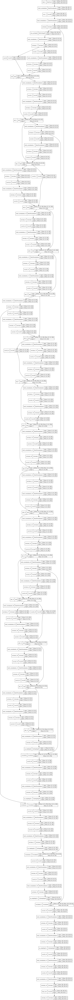

In [ ]:
from keras.utils.vis_utils import plot_model
plot_model(unet_with_resnet34,to_file="/content/drive/My Drive/Colab Notebooks/unet_resnet34.png",show_shapes=True, show_layer_names=True)

In [ ]:
unet_with_resnet34.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 batch_normalization (BatchNorm  (None, 256, 256, 3)  12         ['input_1[0][0]']                
 alization)                                                                                       
                                                                                                  
 conv_1 (Conv2D)                (None, 128, 128, 64  1792        ['batch_normalization[0][0]']    
                                )                                                             

In [ ]:
import datetime
EarlyStopping_callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', 
                                                          patience=5,verbose=1,
                                                          min_delta = 0.00001) # Reduce patience to 7
reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.1,
                              patience=2,min_delta=0.01,verbose=1,
                               min_lr=1e-12)

log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir= log_dir)


#check_point = tf.keras.callbacks.ModelCheckpoint('/content/drive/My Drive/Colab Notebooks/Segmentation_Unetresnet34.hdf5', monitor='val_loss', verbose=1, save_best_only=True )
#check_point = tf.keras.callbacks.ModelCheckpoint('/content/drive/My Drive/Colab Notebooks/Segmentation_pre_Unetresnet34.hdf5', monitor='val_loss', verbose=1, save_best_only=True )
#check_point = tf.keras.callbacks.ModelCheckpoint('/content/drive/My Drive/Colab Notebooks/Segmentation_Unetresnet34_aug.hdf5', monitor='val_loss', verbose=1, save_best_only=True )
#check_point = tf.keras.callbacks.ModelCheckpoint('/content/drive/My Drive/Colab Notebooks/Segmentation_pre_Unetresnet34_aug.hdf5', monitor='val_loss', verbose=1, save_best_only=True )
check_point = tf.keras.callbacks.ModelCheckpoint('/content/drive/My Drive/Colab Notebooks/pre_efficientnetb0.hdf5', monitor='val_loss', verbose=1, save_best_only=True )

optimizer = tf.keras.optimizers.Adam(learning_rate=0.001 ) # 0.001 deafault

In [ ]:
train_data = Datagenerator(df = X_train ,X_col= "MRI_image", Y_col="MRI_mask",img_h = 256 , img_w = 256 )
val_data = Datagenerator(df = X_val ,X_col= "MRI_image", Y_col="MRI_mask",img_h = 256 , img_w = 256 )

In [ ]:
train_steps = X_train.shape[0]//8
val_steps = X_val.shape[0]

Training custom model with imbalanced data:

In [ ]:
'''
2. Focal tversky is generalization of tversky loss, Use tversky as a metric and focal tversky loss as loss

loss = focal_tversky, 
metrics = [tversky]
'''
unet_with_resnet34.compile(optimizer,loss =focal_tversky, metrics = [tversky])
history = unet_with_resnet34.fit_generator(train_data, epochs = 20,\
                              validation_data = val_data,
                              callbacks = [EarlyStopping_callback,check_point,reduce_lr,tensorboard_callback ])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


Epoch 1/20
68/68 [==============================] - ETA: 0s - loss: 0.9510 - tversky: 0.0648
Epoch 00001: val_loss did not improve from 0.92727
68/68 [==============================] - 30s 371ms/step - loss: 0.9510 - tversky: 0.0648 - val_loss: 0.9321 - val_tversky: 0.0895 - lr: 1.0000e-08
Epoch 2/20
68/68 [==============================] - ETA: 0s - loss: 0.9500 - tversky: 0.0660
Epoch 00002: val_loss did not improve from 0.92727
68/68 [==============================] - 25s 360ms/step - loss: 0.9500 - tversky: 0.0660 - val_loss: 0.9304 - val_tversky: 0.0916 - lr: 1.0000e-08
Epoch 3/20
68/68 [==============================] - ETA: 0s - loss: 0.9496 - tversky: 0.0666
Epoch 00003: val_loss did not improve from 0.92727

Epoch 00003: ReduceLROnPlateau reducing learning rate to 1.000000082740371e-09.
68/68 [==============================] - 25s 364ms/step - loss: 0.9496 - tversky: 0.0666 - val_loss: 0.9294 - val_tversky: 0.0930 - lr: 1.0000e-08
Epoch 4/20
68/68 [============================

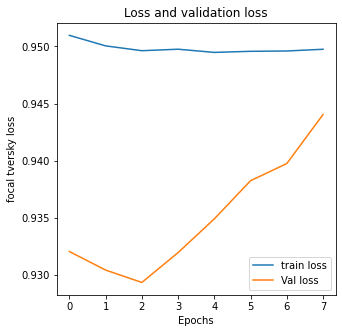

In [ ]:
plt.figure(figsize=(5,5))
plt.title("Loss and validation loss")
plt.xlabel("Epochs")
plt.ylabel("focal tversky loss")
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['train loss','Val loss'])

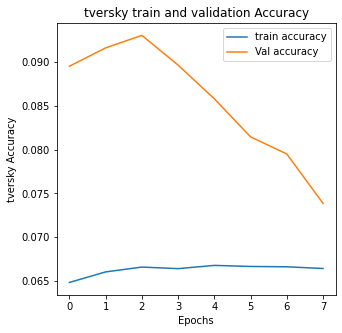

In [ ]:
plt.figure(figsize=(5,5))
plt.title("tversky train and validation Accuracy")
plt.xlabel("Epochs")
plt.ylabel("tversky Accuracy")
plt.plot(history.history['tversky'])
plt.plot(history.history['val_tversky'])
plt.legend(['train accuracy','Val accuracy'])

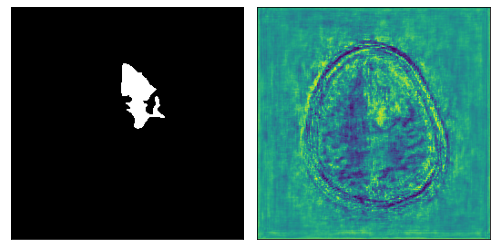

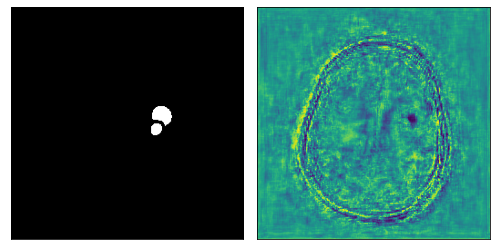

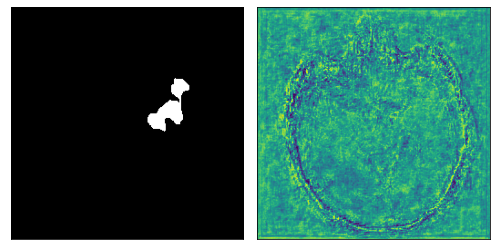

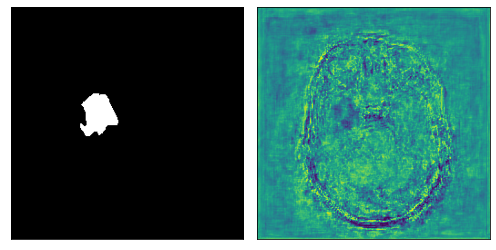

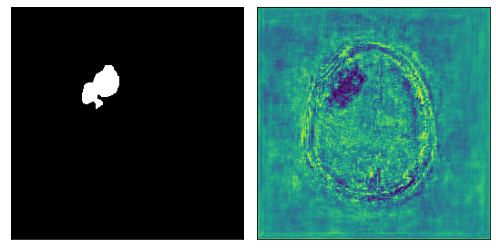

...

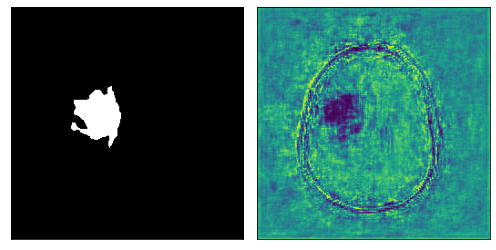

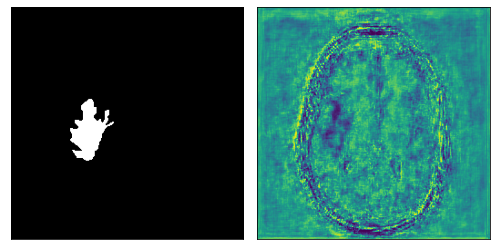

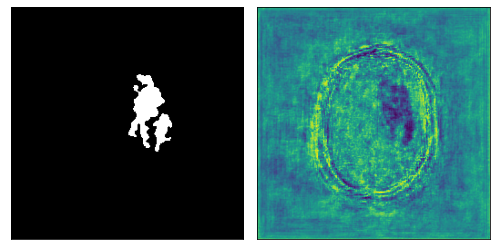

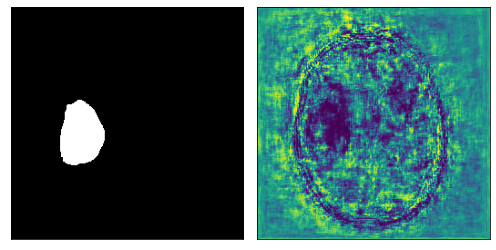

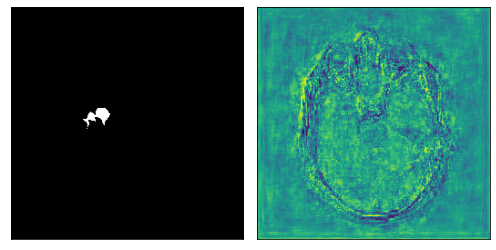

In [ ]:
ind=X_test.index
X_test.loc[ind[0]]['MRI_image']
for i in range(11):
  image_path = X_test.loc[ind[i]]['MRI_image']
  #print("image_path:",image_path)
  mask_path = X_test.loc[ind[i]]['MRI_mask']
  original_mask = cv2.imread(mask_path)
  predicted_mask = predict_mask(image_path,unet_with_resnet34)
  plot_pair(original_mask,predicted_mask)

Training our imbalanced dataset with pretrained Unet with Resnet34:

In [ ]:
import segmentation_models as sm
sm.set_framework('tf.keras')
tf.keras.backend.set_image_data_format('channels_last')
from segmentation_models import Unet

Segmentation Models: using `keras` framework.


In [ ]:
IMAGE_SHAPE = (256, 256, 3)
model = Unet(backbone_name = 'resnet34', input_shape = IMAGE_SHAPE, activation = 'sigmoid', encoder_freeze = True,
             encoder_weights = 'imagenet', decoder_block_type = 'upsampling')

85532672/85521592 [==============================] - 1s 0us/step


In [ ]:
model.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 data (InputLayer)              [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 bn_data (BatchNormalization)   (None, 256, 256, 3)  9           ['data[0][0]']                   
                                                                                                  
 zero_padding2d (ZeroPadding2D)  (None, 262, 262, 3)  0          ['bn_data[0][0]']                
                                                                                                  
 conv0 (Conv2D)                 (None, 128, 128, 64  9408        ['zero_padding2d[0][0]']   

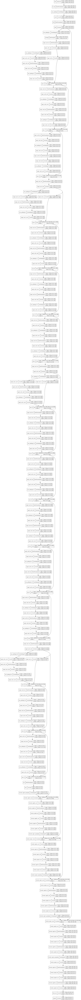

In [ ]:
from keras.utils.vis_utils import plot_model
plot_model(model,to_file="/content/drive/My Drive/Colab Notebooks/pretrained_unet_resnet34.png",show_shapes=True, show_layer_names=True)

In [ ]:
model.compile(optimizer,loss =focal_tversky, metrics = [tversky])
history1 = model.fit_generator(train_data, epochs = 20,\
                              validation_data = val_data,
                              callbacks = [EarlyStopping_callback,check_point,reduce_lr,tensorboard_callback ])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


Epoch 1/20
68/68 [==============================] - ETA: 0s - loss: 0.6962 - tversky: 0.3759
Epoch 00001: val_loss improved from inf to 0.95848, saving model to /content/drive/My Drive/Colab Notebooks/Segmentation_pre_Unetresnet34.hdf5
68/68 [==============================] - 23s 238ms/step - loss: 0.6962 - tversky: 0.3759 - val_loss: 0.9585 - val_tversky: 0.0550 - lr: 0.0010
Epoch 2/20
68/68 [==============================] - ETA: 0s - loss: 0.3382 - tversky: 0.7630
Epoch 00002: val_loss did not improve from 0.95848
68/68 [==============================] - 15s 224ms/step - loss: 0.3382 - tversky: 0.7630 - val_loss: 0.9879 - val_tversky: 0.0162 - lr: 0.0010
Epoch 3/20
68/68 [==============================] - ETA: 0s - loss: 0.2587 - tversky: 0.8342
Epoch 00003: val_loss did not improve from 0.95848

Epoch 00003: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
68/68 [==============================] - 15s 225ms/step - loss: 0.2587 - tversky: 0.8342 - val_loss: 0.9982 

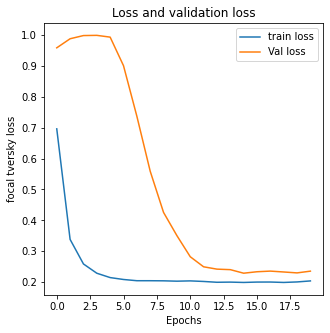

In [ ]:
plt.figure(figsize=(5,5))
plt.title("Loss and validation loss")
plt.xlabel("Epochs")
plt.ylabel("focal tversky loss")
plt.plot(history1.history['loss'])
plt.plot(history1.history['val_loss'])
plt.legend(['train loss','Val loss'])

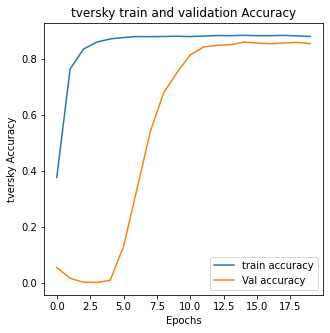

In [ ]:
plt.figure(figsize=(5,5))
plt.title("tversky train and validation Accuracy")
plt.xlabel("Epochs")
plt.ylabel("tversky Accuracy")
plt.plot(history1.history['tversky'])
plt.plot(history1.history['val_tversky'])
plt.legend(['train accuracy','Val accuracy'])

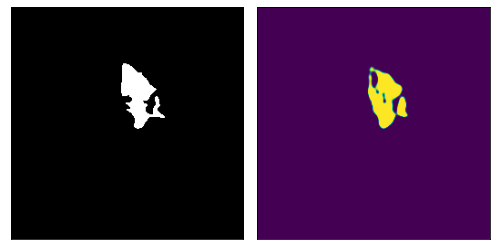

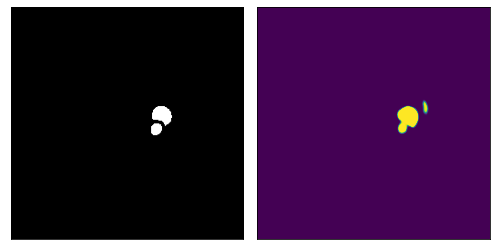

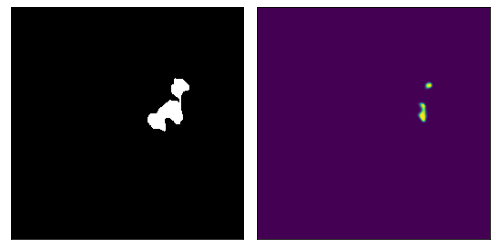

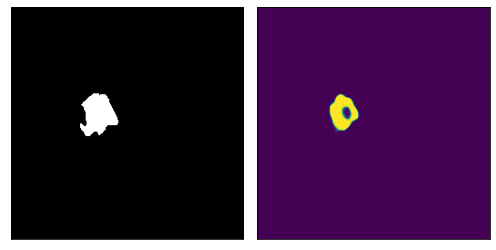

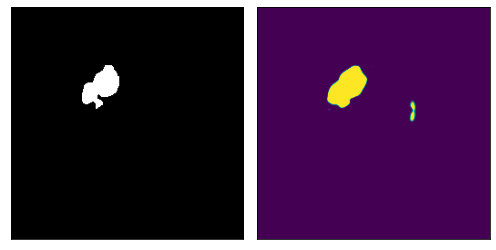

...

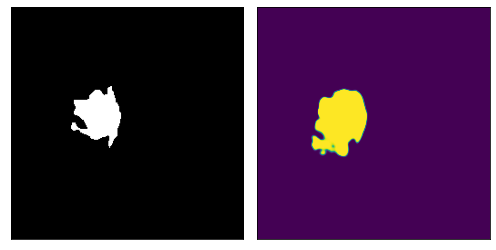

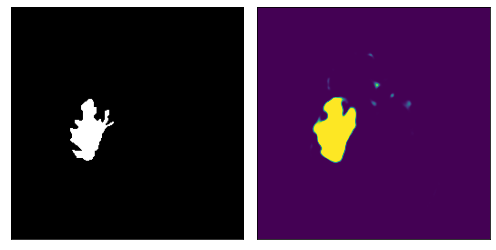

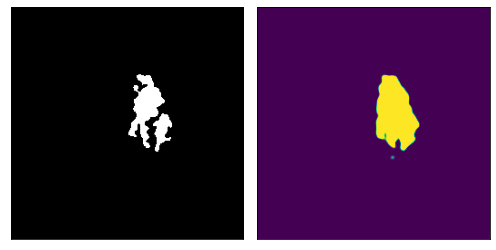

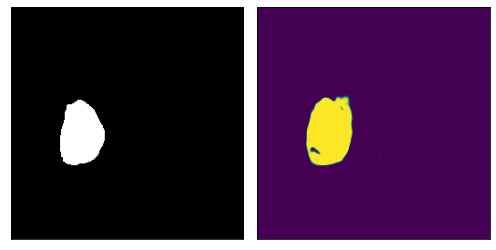

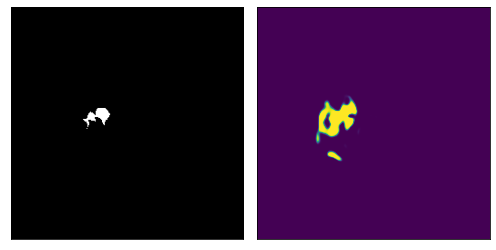

In [ ]:
ind=X_test.index
X_test.loc[ind[0]]['MRI_image']
for i in range(11):
  image_path = X_test.loc[ind[i]]['MRI_image']
  #print("image_path:",image_path)
  mask_path = X_test.loc[ind[i]]['MRI_mask']
  original_mask = cv2.imread(mask_path)
  predicted_mask = predict_mask(image_path,model)
  plot_pair(original_mask,predicted_mask)

In [ ]:
model.evaluate(val_data)

8/8 [==============================] - 1s 81ms/step - loss: 0.2384 - tversky: 0.8516


[0.23841698467731476, 0.8516108393669128]

In [ ]:
model.evaluate(test_data)

8/8 [==============================] - 1s 119ms/step - loss: 0.2193 - tversky: 0.8671


[0.21934522688388824, 0.8670725226402283]

**OBSERVATION:**

The above shows that when we train our model with the imbalanced dataset without augmentation, our model (unet with resent34 as backbone - ***both custom & pretrained***) does not perform well as we could see that our model does not predict the tumor perfectly for the MRI scan image which has tumor.

MAKING DATA FROM IMBALANCED TO BALANCED DATA USING IMAGE AUGMENTATION:

In [ ]:
# Data Augmentation functions.
#https://imgaug.readthedocs.io/en/latest/source/examples_basics.html
import imgaug.augmenters as iaa
aug2 = iaa.Fliplr(1) #flip left right ->horizontally flip 50% of all images
aug3 = iaa.Flipud(1) #flip up & down  ->vertically flip 20% of all images
aug4 = iaa.AverageBlur(k=(2, 7))  #blur image
aug5 = iaa.DirectedEdgeDetect(alpha=(0.8), direction=(1.0))
aug6 = iaa.Sharpen(alpha=(1.0), lightness=(1.5))  #sharpen image

In [ ]:
def augmentimage(img_path,mask_path):
  img=cv2.imread(img_path)
  mask=cv2.imread(mask_path)
  a = np.random.uniform()
  if a<0.2:
    oper="Fliplr"
    image = aug2.augment_image(img)
    image_mask = aug2.augment_image(mask)
    #image_mask = cv2.cvtColor(image_mask, cv2.COLOR_BGR2RGB)
  elif a<0.4:
    oper="Flipud"
    image = aug3.augment_image(img)
    image_mask = aug3.augment_image(mask)
    #image_mask = cv2.cvtColor(image_mask, cv2.COLOR_BGR2RGB)
  elif a<0.6:
    oper="blur"
    image = aug4.augment_image(img)
    image_mask = aug4.augment_image(mask)
    #image_mask = cv2.cvtColor(image_mask, cv2.COLOR_BGR2RGB)
  elif a<0.8:
    oper="edgedetect"
    image = aug5.augment_image(img)
    image_mask = aug5.augment_image(mask)
    #image_mask = cv2.cvtColor(image_mask, cv2.COLOR_BGR2RGB)
  else:
    oper="Sharpen"
    image = aug6.augment_image(img)
    image_mask = aug6.augment_image(mask)
    #image_mask = cv2.cvtColor(image_mask, cv2.COLOR_BGR2RGB)
  #image = cv2.resize(image,(256,256))
  #https://stackoverflow.com/questions/41966514/how-fast-in-python-change-3-channel-rgb-color-image-to-1-channel-gray
  image_mask = cv2.cvtColor(image_mask, cv2.COLOR_BGR2GRAY)
  #image_mask=np.expand_dims(image_mask,axis = 2)
  aug_image_path = image_path[:-4] + '_' + oper + '.tif'
  aug_image_path = aug_image_path.replace('/content/lgg-mri-segmentation/kaggle_3m', '/content/lgg-mri-segmentation/augmented_data')
  dirname = os.path.dirname(aug_image_path)
  if not os.path.exists(dirname):
    os.makedirs(dirname)

  aug_mask_path = mask_path[:-4] + '_mask' + oper + '.tif'
  aug_mask_path = aug_mask_path.replace('/content/lgg-mri-segmentation/kaggle_3m', '/content/lgg-mri-segmentation/augmented_data')
  dirname = os.path.dirname(aug_mask_path)
  if not os.path.exists(dirname):
    os.makedirs(dirname)


  #print(aug_image_path, aug_mask_path)


  if not cv2.imwrite(aug_image_path, image):
    print("Image not saved")
  if not cv2.imwrite( aug_mask_path, image_mask):
    print("mask not saved")
 
  return aug_image_path,aug_mask_path

In [ ]:
not_tumor_count = images_df["is_tumor"].value_counts()[0]
tumor_count = images_df["is_tumor"].value_counts()[1]
not_tumor_count,tumor_count

(2556, 1373)

In [ ]:
difference  = not_tumor_count - tumor_count
difference

1183

Here we will take more "tumor" data for image augmentation unlike before because previouse dataset has more number of "tumor" data than "no tumor" data.So our model underfits while training it. Hence i have taken only 100 images & mask of "no tumor" data and taken 1283 images & mask of "tumor" data before applying image augmentation. So that we can concatenate both augmented dataset and original dataset to get a balanced dataset.

In [ ]:
number_augmented_image=100
no_tumor=images_df[images_df['is_tumor']==0].sample(number_augmented_image)
tumor=images_df[images_df['is_tumor']==1].sample(number_augmented_image+difference)

In [ ]:
len(tumor),len(no_tumor)

(1283, 100)

In [ ]:
aug_image=[]
aug_mask=[]
for idx in no_tumor.index:
    image_path = no_tumor['MRI_image'][idx]
    mask_path = no_tumor['MRI_mask'][idx]
    aug_image_path,aug_mask_path=augmentimage(image_path, mask_path)
    aug_image.append(aug_image_path)
    aug_mask.append(aug_mask_path)

In [ ]:
for idx in tumor.index:
    image_path = tumor['MRI_image'][idx]
    mask_path = tumor['MRI_mask'][idx]
    aug_image_path,aug_mask_path=augmentimage(image_path, mask_path)
    aug_image.append(aug_image_path)
    aug_mask.append(aug_mask_path)

In [ ]:
aug_images_mask = pd.DataFrame(data = zip(aug_image,aug_mask),columns= ['MRI_image', 'MRI_mask'])
aug_images_mask.head()

,MRI_image,MRI_mask
0,/content/lgg-mri-segmentation/augmented_data/T...,/content/lgg-mri-segmentation/augmented_data/T...
1,/content/lgg-mri-segmentation/augmented_data/T...,/content/lgg-mri-segmentation/augmented_data/T...
2,/content/lgg-mri-segmentation/augmented_data/T...,/content/lgg-mri-segmentation/augmented_data/T...
3,/content/lgg-mri-segmentation/augmented_data/T...,/content/lgg-mri-segmentation/augmented_data/T...
4,/content/lgg-mri-segmentation/augmented_data/T...,/content/lgg-mri-segmentation/augmented_data/T...


In [ ]:
tiff_file = aug_images_mask['MRI_image'][0]
I = plt.imread(tiff_file)
tiff_file = aug_images_mask['MRI_mask'][0]
J = plt.imread(tiff_file)

print(I.shape)
print(J.shape)

(256, 256, 3)
(256, 256)


In [ ]:
aug_images_mask["is_tumor"] = aug_images_mask['MRI_mask'].apply(istumor)
#images_df["is_tumor"] = images_df['MRI_mask'].apply(istumor)

Combining both the augmented (it will have more images and mask of "tumor" data 

---

as the original dataset has higher number of "no tumor" data than "tumor" data) and original dataset to make the dataset balanced.


In [ ]:
total_df = pd.concat([images_df,aug_images_mask], ignore_index= True)

In [ ]:
print(total_df.shape)
total_df.head()

(5312, 3)


,MRI_image,MRI_mask,is_tumor
0,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...,0
1,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...,0
2,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...,0
3,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...,0
4,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...,1


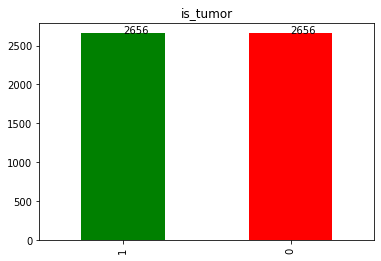

In [ ]:
ax = total_df["is_tumor"].value_counts().plot(kind = "bar",title = "is_tumor",color=['g','r'] )
for patch in ax.patches:
    #print(patch)
    ax.annotate(xy = (patch.get_x() + 0.25 ,patch.get_height()+0.5 ),s = str(patch.get_height()) )

In [ ]:
tumor_data  = total_df[total_df["is_tumor"] == 1]
X_train,X_val = train_test_split(tumor_data, test_size=0.2)
X_test,X_val = train_test_split(X_val, test_size=0.5)

print("Train data shape", X_train.shape)
print("Test data shape", X_test.shape)
print("Validation data shape", X_val.shape)

train_data = Datagenerator(df = X_train ,X_col= "MRI_image", Y_col="MRI_mask",img_h = 256 , img_w = 256 )
val_data = Datagenerator(df = X_val ,X_col= "MRI_image", Y_col="MRI_mask",img_h = 256 , img_w = 256 )

train_steps = X_train.shape[0]//8
val_steps = X_val.shape[0]

Train data shape (2124, 3)
Test data shape (266, 3)
Validation data shape (266, 3)


In [ ]:
train_steps, val_steps

(265, 266)

In [ ]:
unet_with_resnet34.compile(optimizer,loss =focal_tversky, metrics = [tversky])
history = unet_with_resnet34.fit_generator(train_data, epochs = 10,\
                              validation_data = val_data,
                              callbacks = [EarlyStopping_callback,check_point,reduce_lr,tensorboard_callback ])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


Epoch 1/10
132/132 [==============================] - ETA: 0s - loss: 0.2573 - tversky: 0.8349
Epoch 00001: val_loss improved from 0.32987 to 0.22969, saving model to /content/drive/My Drive/Colab Notebooks/Segmentation_Unetresnet34_aug.hdf5
132/132 [==============================] - 121s 832ms/step - loss: 0.2573 - tversky: 0.8349 - val_loss: 0.2297 - val_tversky: 0.8584 - lr: 0.0010
Epoch 2/10
132/132 [==============================] - ETA: 0s - loss: 0.2295 - tversky: 0.8584
Epoch 00002: val_loss did not improve from 0.22969
132/132 [==============================] - 102s 772ms/step - loss: 0.2295 - tversky: 0.8584 - val_loss: 0.2719 - val_tversky: 0.8225 - lr: 0.0010
Epoch 3/10
132/132 [==============================] - ETA: 0s - loss: 0.2132 - tversky: 0.8717
Epoch 00003: val_loss did not improve from 0.22969

Epoch 00003: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
132/132 [==============================] - 102s 770ms/step - loss: 0.2132 - tversky: 0.8717 

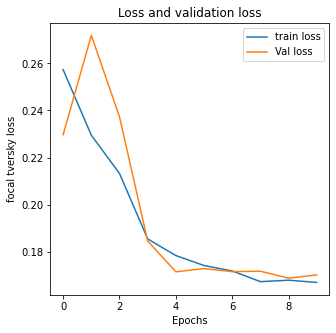

In [ ]:
plt.figure(figsize=(5,5))
plt.title("Loss and validation loss")
plt.xlabel("Epochs")
plt.ylabel("focal tversky loss")
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['train loss','Val loss'])

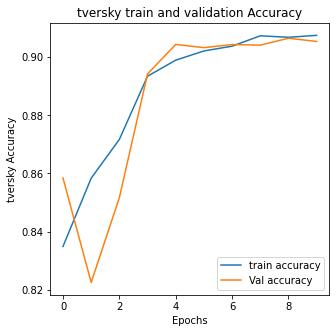

In [ ]:
plt.figure(figsize=(5,5))
plt.title("tversky train and validation Accuracy")
plt.xlabel("Epochs")
plt.ylabel("tversky Accuracy")
plt.plot(history.history['tversky'])
plt.plot(history.history['val_tversky'])
plt.legend(['train accuracy','Val accuracy'])

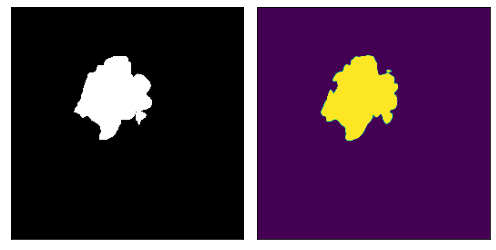

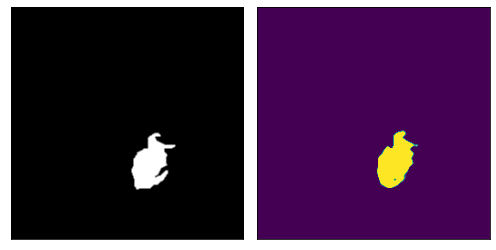

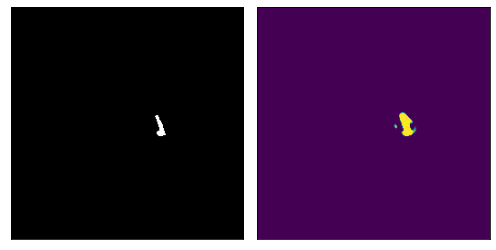

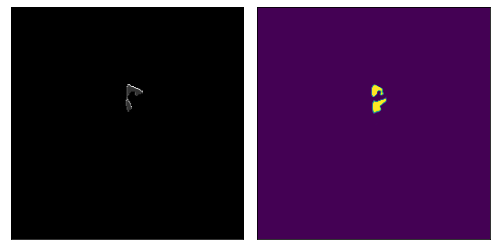

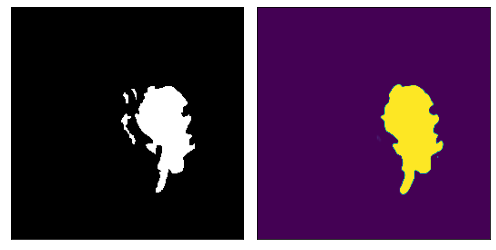

...

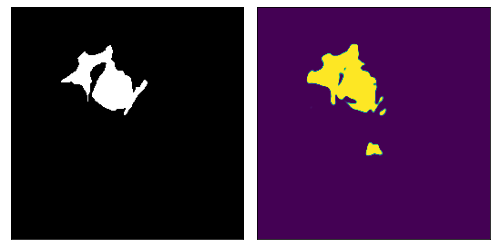

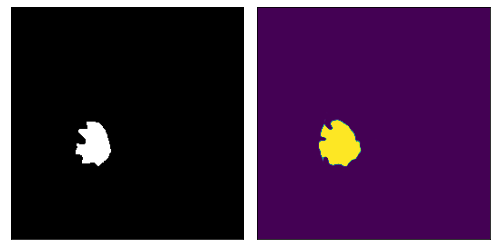

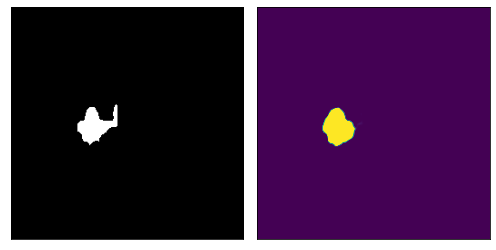

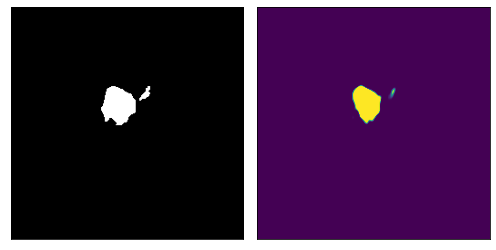

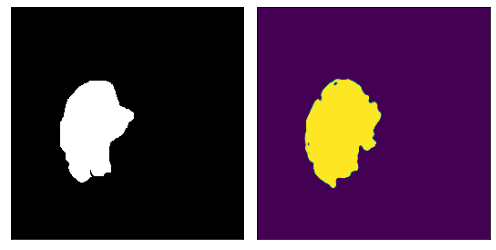

In [ ]:
ind=X_test.index
X_test.loc[ind[0]]['MRI_image']
for i in range(11):
  image_path = X_test.loc[ind[i]]['MRI_image']
  #print("image_path:",image_path)
  mask_path = X_test.loc[ind[i]]['MRI_mask']
  original_mask = cv2.imread(mask_path)
  predicted_mask = predict_mask(image_path,unet_with_resnet34)
  plot_pair(original_mask,predicted_mask)

In [ ]:
test_data = Datagenerator(df = X_test ,X_col= "MRI_image", Y_col="MRI_mask",img_h = 256 , img_w = 256 )

In [ ]:
unet_with_resnet34.evaluate(val_data)

16/16 [==============================] - 4s 241ms/step - loss: 0.1717 - tversky: 0.9043


[0.1716604083776474, 0.9042854309082031]

In [ ]:
unet_with_resnet34.evaluate(test_data)

16/16 [==============================] - 4s 265ms/step - loss: 0.2066 - tversky: 0.8772


[0.20656229555606842, 0.877196192741394]

In [ ]:
import pickle
pickle.dump((unet_with_resnet34),open('/content/drive/My Drive/Colab Notebooks/final_unet_resnet34.pkl','wb'))

In [ ]:
model.compile(optimizer,loss =focal_tversky, metrics = [tversky])
history1 = model.fit_generator(train_data, epochs = 10,\
                              validation_data = val_data,
                              callbacks = [EarlyStopping_callback,check_point,reduce_lr,tensorboard_callback ])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


Epoch 1/10
132/132 [==============================] - ETA: 0s - loss: 0.2361 - tversky: 0.8533
Epoch 00001: val_loss improved from 0.62183 to 0.27934, saving model to /content/drive/My Drive/Colab Notebooks/Segmentation_pre_Unetresnet34_aug.hdf5
132/132 [==============================] - 139s 572ms/step - loss: 0.2361 - tversky: 0.8533 - val_loss: 0.2793 - val_tversky: 0.8167 - lr: 0.0010
Epoch 2/10
132/132 [==============================] - ETA: 0s - loss: 0.2047 - tversky: 0.8784
Epoch 00002: val_loss improved from 0.27934 to 0.22037, saving model to /content/drive/My Drive/Colab Notebooks/Segmentation_pre_Unetresnet34_aug.hdf5
132/132 [==============================] - 74s 557ms/step - loss: 0.2047 - tversky: 0.8784 - val_loss: 0.2204 - val_tversky: 0.8662 - lr: 0.0010
Epoch 3/10
132/132 [==============================] - ETA: 0s - loss: 0.1878 - tversky: 0.8919
Epoch 00003: val_loss improved from 0.22037 to 0.18937, saving model to /content/drive/My Drive/Colab Notebooks/Segmentati

In [ ]:
model.evaluate(val_data)

16/16 [==============================] - 3s 177ms/step - loss: 0.1626 - tversky: 0.9109


[0.16258108615875244, 0.9109309911727905]

In [ ]:
model.evaluate(test_data)

16/16 [==============================] - 3s 171ms/step - loss: 0.1841 - tversky: 0.8949


[0.18408216536045074, 0.8949034214019775]

In [ ]:
import pickle
pickle.dump((model),open('/content/drive/My Drive/Colab Notebooks/final_unet_resnet34_pretrained.pkl','wb'))

INFO:tensorflow:Assets written to: ram://e6406fae-a328-4baa-9070-88f6f1f5f316/assets


/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


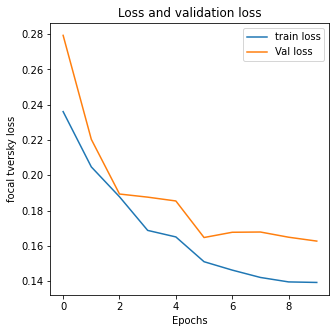

In [ ]:
plt.figure(figsize=(5,5))
plt.title("Loss and validation loss")
plt.xlabel("Epochs")
plt.ylabel("focal tversky loss")
plt.plot(history1.history['loss'])
plt.plot(history1.history['val_loss'])
plt.legend(['train loss','Val loss'])

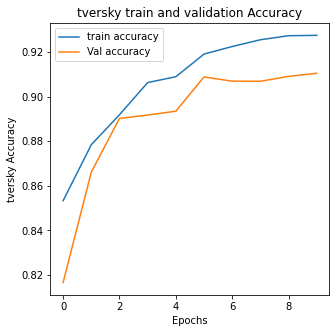

In [ ]:
plt.figure(figsize=(5,5))
plt.title("tversky train and validation Accuracy")
plt.xlabel("Epochs")
plt.ylabel("tversky Accuracy")
plt.plot(history1.history['tversky'])
plt.plot(history1.history['val_tversky'])
plt.legend(['train accuracy','Val accuracy'])

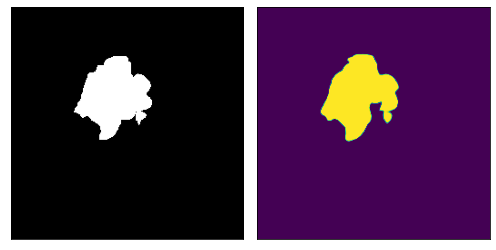

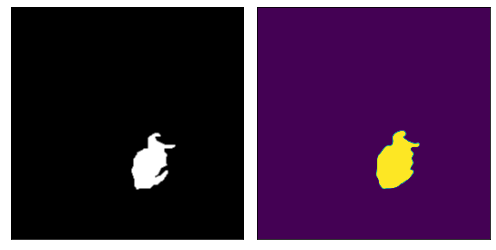

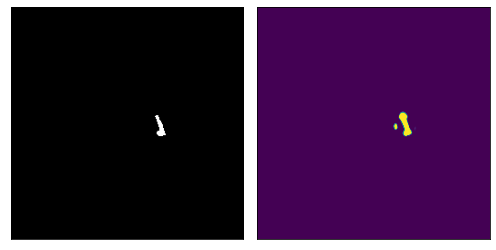

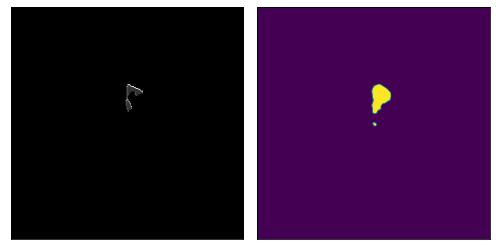

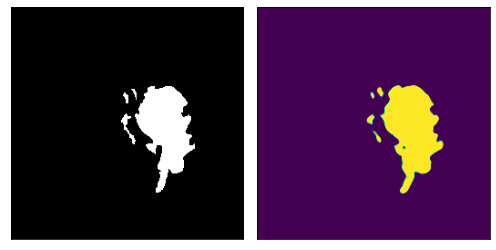

...

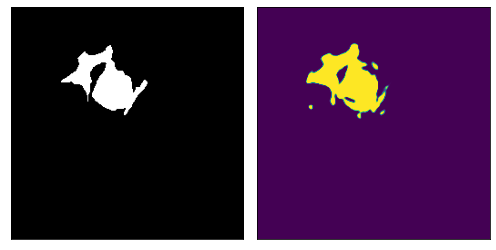

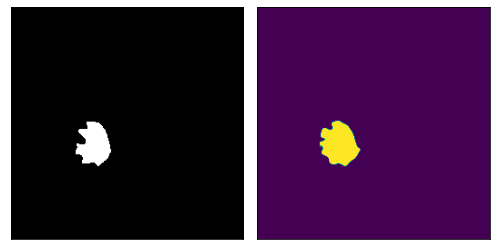

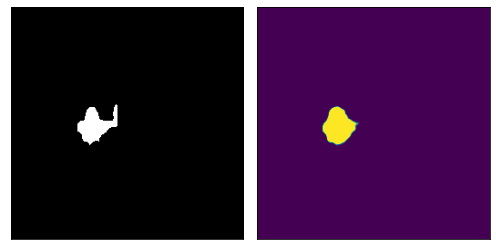

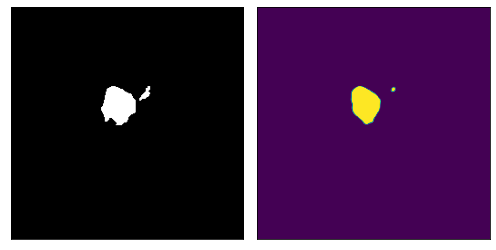

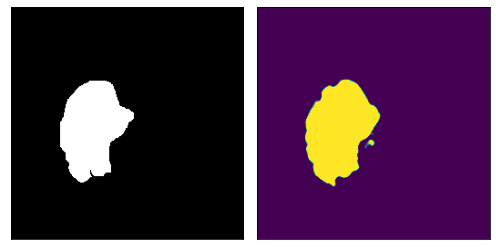

In [ ]:
ind=X_test.index
X_test.loc[ind[0]]['MRI_image']
for i in range(11):
  image_path = X_test.loc[ind[i]]['MRI_image']
  #print("image_path:",image_path)
  mask_path = X_test.loc[ind[i]]['MRI_mask']
  original_mask = cv2.imread(mask_path)
  predicted_mask = predict_mask(image_path,model)
  plot_pair(original_mask,predicted_mask)

**OBSERVATION:**

The above shows that when we train our model with the balanced dataset with augmentation, our model (unet with resent34 as backbone - ***both custom & pretrained***) does  perform well as we could see that our model does predict the tumor somewhat perfectly for the MRI scan image which has tumor.

We need to increase the number of epoch to increase the accuracy of our model.

Pretrained unet with efficientnetb0:

In [ ]:
import segmentation_models as sm
sm.set_framework('tf.keras')
tf.keras.backend.set_image_data_format('channels_last')
from segmentation_models import Unet

In [ ]:
IMAGE_SHAPE = (256, 256, 3)
model1 = Unet(backbone_name = 'efficientnetb0', input_shape = IMAGE_SHAPE, activation = 'sigmoid', encoder_freeze = True,
             encoder_weights = 'imagenet', decoder_block_type = 'upsampling')

In [ ]:
model1.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 stem_conv (Conv2D)             (None, 128, 128, 32  864         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 stem_bn (BatchNormalization)   (None, 128, 128, 32  128         ['stem_conv[0][0]']              
                                )                                                             

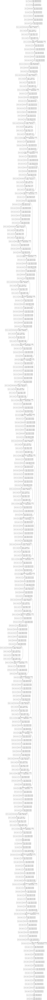

In [ ]:
from keras.utils.vis_utils import plot_model
plot_model(model1,to_file="/content/drive/My Drive/Colab Notebooks/efficientnetb0.png",show_shapes=True, show_layer_names=True)

In [ ]:
train_steps = X_train.shape[0]//16
val_steps = X_val.shape[0]//16

In [ ]:
model1.compile(optimizer,loss =focal_tversky, metrics = [tversky])
history2 = model1.fit_generator(train_data, steps_per_epoch = train_steps, epochs = 10,\
                              validation_data = val_data, validation_steps = val_steps,
                              callbacks = [EarlyStopping_callback,check_point,reduce_lr,tensorboard_callback ])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


Epoch 1/10
132/132 [==============================] - ETA: 0s - loss: 0.5045 - tversky: 0.5827
Epoch 00001: val_loss improved from inf to 0.66318, saving model to /content/drive/My Drive/Colab Notebooks/pre_efficientnetb0.hdf5
132/132 [==============================] - 88s 562ms/step - loss: 0.5045 - tversky: 0.5827 - val_loss: 0.6632 - val_tversky: 0.4208 - lr: 0.0010
Epoch 2/10
132/132 [==============================] - ETA: 0s - loss: 0.2415 - tversky: 0.8486
Epoch 00002: val_loss improved from 0.66318 to 0.26032, saving model to /content/drive/My Drive/Colab Notebooks/pre_efficientnetb0.hdf5
132/132 [==============================] - 73s 556ms/step - loss: 0.2415 - tversky: 0.8486 - val_loss: 0.2603 - val_tversky: 0.8330 - lr: 0.0010
Epoch 3/10
132/132 [==============================] - ETA: 0s - loss: 0.2076 - tversky: 0.8759
Epoch 00003: val_loss improved from 0.26032 to 0.19694, saving model to /content/drive/My Drive/Colab Notebooks/pre_efficientnetb0.hdf5
132/132 [============

In [ ]:
model1.evaluate(val_data)

16/16 [==============================] - 3s 174ms/step - loss: 0.1615 - tversky: 0.9112


[0.16152626276016235, 0.911169707775116]

In [ ]:
model1.evaluate(test_data)

16/16 [==============================] - 3s 171ms/step - loss: 0.1880 - tversky: 0.8913


[0.18801994621753693, 0.8913410902023315]

In [ ]:
import pickle
pickle.dump((model1),open('/content/drive/My Drive/Colab Notebooks/final_efficientnetb0.pkl','wb'))

INFO:tensorflow:Assets written to: ram://2adc0ce8-f586-405b-8357-4f5d769b43a2/assets


/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


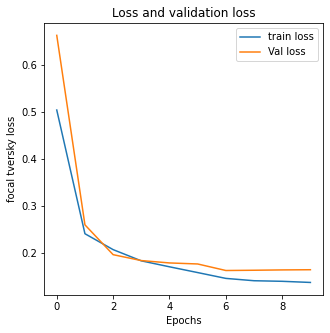

In [ ]:
plt.figure(figsize=(5,5))
plt.title("Loss and validation loss")
plt.xlabel("Epochs")
plt.ylabel("focal tversky loss")
plt.plot(history2.history['loss'])
plt.plot(history2.history['val_loss'])
plt.legend(['train loss','Val loss'])

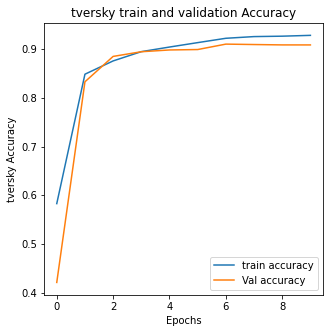

In [ ]:
plt.figure(figsize=(5,5))
plt.title("tversky train and validation Accuracy")
plt.xlabel("Epochs")
plt.ylabel("tversky Accuracy")
plt.plot(history2.history['tversky'])
plt.plot(history2.history['val_tversky'])
plt.legend(['train accuracy','Val accuracy'])

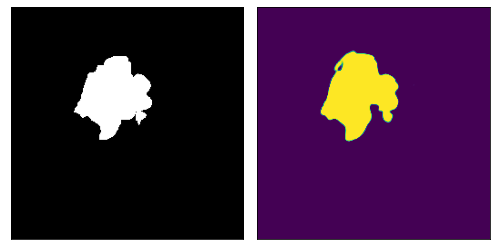

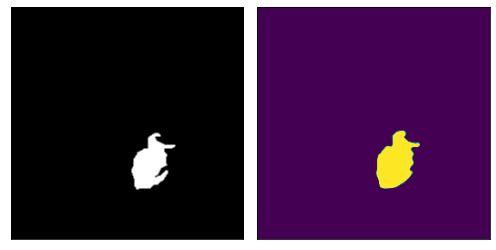

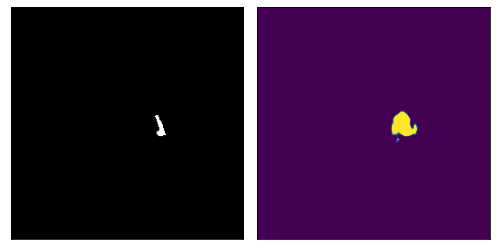

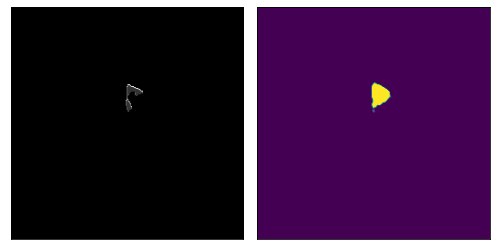

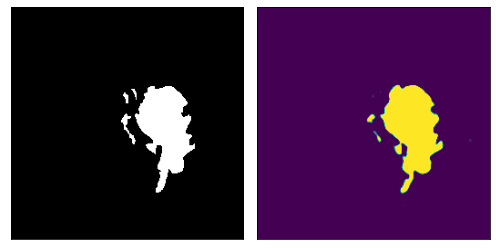

...

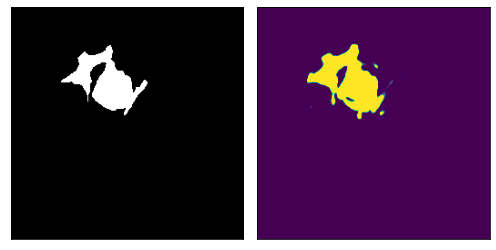

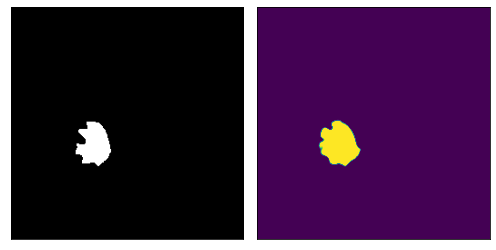

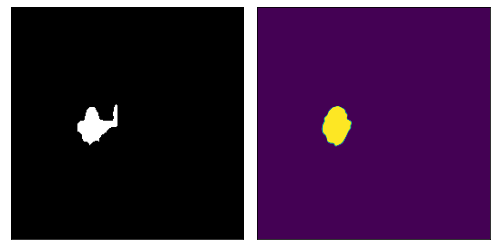

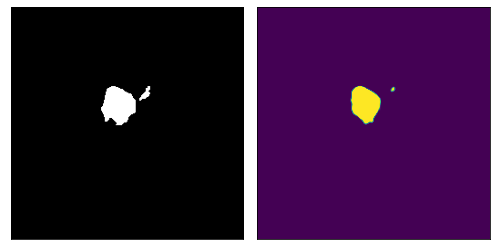

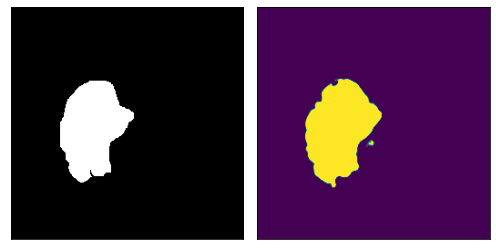

In [ ]:
ind=X_test.index
X_test.loc[ind[0]]['MRI_image']
for i in range(11):
  image_path = X_test.loc[ind[i]]['MRI_image']
  #print("image_path:",image_path)
  mask_path = X_test.loc[ind[i]]['MRI_mask']
  original_mask = cv2.imread(mask_path)
  predicted_mask = predict_mask(image_path,model1)
  plot_pair(original_mask,predicted_mask)

**OBSERVATION:**

When we train our data with unet with efficientnetb0, the accuracy of our model increased little bit compare to before.